In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as scp

In [3]:
import seaborn as sns

# k-mers generation

In [5]:
olga_trb = pd.read_csv('/home/dluppov/TRB_10_7.tsv', sep = '\t', header = None)
olga_trb.rename(columns = {0: 'seq', 1: 'aa', 2: 'V_gene', 3: 'J_gene'}, inplace = True)
keck_raw = pd.read_csv('/home/dluppov/tcr-thymic-selection/naive_cells/hip_full/naive_clonotypes_keck.csv.gz')

#фильтр неканонических посследовательностей
keck_raw = keck_raw.loc[np.logical_and(keck_raw.cdr3aa.str.startswith('C'), 
               np.logical_or(keck_raw.cdr3aa.str.endswith('W'),
                             keck_raw.cdr3aa.str.endswith('F')))]

In [6]:
from itertools import islice
import tqdm
 
def over_slice(test_str, k=4):
    itr = iter(test_str)
    res = tuple(islice(itr, k))
    if len(res) == k:
        yield res   
    for ele in itr:
        res = res[1:] + (ele,)
        yield res

        
def k_mers_list_generatot(seq, k=4):
    res = ["".join(ele) for ele in over_slice(seq, k)]
    return res

In [7]:
res = keck_raw.cdr3aa.apply(lambda x: np.array(k_mers_list_generatot(x, k=4)))
res_list = np.concatenate(np.array(res))
kmer_freq = pd.Series(res_list).value_counts()
pd.Series(kmer_freq).to_csv('./Sample_kmers_counts.csv')


# k-mer analysis

In [8]:
#присвоим каждой последовательности хэш, такой, что он будет одинаковым у палиндромов
def palindrome_hash(kmer):
    kmer_hash = hash(kmer) + hash(kmer[::-1]) 
    return kmer_hash

In [90]:
keck_kmers = pd.read_csv('/home/dluppov/Sample_kmers_counts.csv', index_col=0)
keck_kmers

,0
CASS,603959
TQYF,171754
EQYF,143523
ASSL,137861
EQFF,132964
...,...
EMAH,1
HMEF,1
IGHV,1
ELYW,1


In [10]:
hashes = pd.Series(keck_kmers.index).apply(lambda x: palindrome_hash(x))#.value_counts()
hashes

0           9477075877431948972
1           7622378599792630043
2           6888696700102366035
3          13001418082902148694
4          -5827591364103849018
                  ...          
113998     11403906157178482554
113999    -10055432595545341028
114000     -6028120838155676598
114001     -2510199148363346032
114002     13304347720485763739
Length: 114003, dtype: object

In [11]:
hashes.value_counts()

9477075877431948972     2
4286484176223935500     2
-6587779227557904455    2
721934992596689870      2
-8212377846924290156    2
                       ..
1286419325673105756     1
-8215389595818244351    1
12128992383419167886    1
-2197950842833752975    1
13304347720485763739    1
Length: 65175, dtype: int64

In [12]:
hashes.index = keck_kmers.index

In [13]:
keck_kmers.insert(1, 'hash', hashes)
keck_kmers

,0,hash
CASS,603959,9477075877431948972
TQYF,171754,7622378599792630043
EQYF,143523,6888696700102366035
ASSL,137861,13001418082902148694
EQFF,132964,-5827591364103849018
...,...,...
EMAH,1,11403906157178482554
HMEF,1,-10055432595545341028
IGHV,1,-6028120838155676598
ELYW,1,-2510199148363346032


In [14]:
keck_kmers_summed = keck_kmers.groupby('hash').sum()
keck_kmers_summed

,0
hash,
-18400756297010303542,2
-18395992370017454937,26
-18367623627595443249,62
-18353074878964885555,10
-18328326322953789216,17
...,...
18310319503523787698,10
18313601118008544149,26
18343964828922297514,8


In [15]:
hases_dict = hashes.to_dict()
hases_dict = dict(zip(hases_dict.values(), hases_dict.keys()))
hases_dict

{9477075877431948972: 'SSAC',
 7622378599792630043: 'FYQT',
 6888696700102366035: 'FYQE',
 13001418082902148694: 'LSSA',
 -5827591364103849018: 'FFQE',
 -9736071241695502127: 'FTYG',
 2679586538563103552: 'FFAE',
 6716294151550203981: 'FQEN',
 -7878252149522160287: 'YQEY',
 -5923824044470057104: 'YQTD',
 -12687883680553855243: 'FAET',
 8845776186371074242: 'PSSA',
 -2602740441854120662: 'YQTE',
 1419736599107433242: 'QSSA',
 -10174613076784487405: 'TYGY',
 7578875710073096702: 'FHQP',
 -16317368920845626641: 'FFLE',
 10791943525769100345: 'FLEG',
 -7670092672233291024: 'HQPQ',
 -3557576730371701317: 'QENY',
 1008878284631650970: 'QTDT',
 1196682380465088363: 'CASR',
 3406114536437030202: 'SSSA',
 6330616113951499865: 'LEGT',
 -7583596702615289042: 'FFLK',
 159097278672159827: 'CSAR',
 2635016384672945071: 'AETN',
 -9011581685925518985: 'FLKE',
 -13480498858666570152: 'QPQN',
 705673782808750995: 'YSSA',
 11792833774098021497: 'FSSA',
 -1458690854877967618: 'TIYF',
 4153811685115419599:

In [16]:
keck_kmers_summed.index = pd.Series(keck_kmers_summed.index).apply(lambda x: hases_dict[x])
keck_kmers_summed

,0
hash,
MGNH,2
GEIF,26
GHFG,62
FEFG,10
MSAR,17
...,...
MIGP,10
RKVR,26
WTVK,8


In [17]:
keck_kmers_summed.to_csv('/home/dluppov/Sample_kmers_counts_mirror_sum.csv')

In [18]:
(keck_kmers_summed["0"]).sort_values(ascending=False)

hash
SSAC    603960
FYQT    171758
FYQE    143551
LSSA    137966
FFQE    132979
         ...  
HEFQ         1
KKTW         1
DFMV         1
WELM         1
NNNN         1
Name: 0, Length: 65175, dtype: int64

# Analysis

In [91]:
keck_kmers = pd.read_csv('/home/dluppov/Sample_kmers_counts_mirror_sum.csv', index_col=0)
olga_kmers = pd.read_csv('/home/dluppov/OLGA_kmers_counts_mirror_sum.csv', index_col=0)
# keck_kmers = pd.read_csv('./Sample_kmers_counts.csv', index_col=0)
# olga_kmers = pd.read_csv('./Olga_kmers_counts.csv', index_col=0)

In [57]:
hashes_keck = pd.Series(keck_kmers.index).apply(lambda x: palindrome_hash(x))
hashes_keck.index = keck_kmers.index
keck_kmers.index.name = 'kmer'
keck_kmers.insert(0, 'hash', hashes_keck)

keck_kmers = keck_kmers.reset_index().set_index('hash')

hashes_olga = pd.Series(olga_kmers.index).apply(lambda x: palindrome_hash(x))
hashes_olga.index = olga_kmers.index
olga_kmers.index.name = 'kmer'
olga_kmers.insert(0, 'hash', hashes_olga)
olga_kmers = olga_kmers.reset_index().set_index('hash')

In [58]:
keck_kmers

,kmer,0
hash,,
-18400756297010303542,MGNH,2
-18395992370017454937,GEIF,26
-18367623627595443249,GHFG,62
-18353074878964885555,FEFG,10
-18328326322953789216,MSAR,17
...,...,...
18310319503523787698,MIGP,10
18313601118008544149,RKVR,26
18343964828922297514,WTVK,8


In [59]:
common_kmers = list(set(keck_kmers.index).intersection(olga_kmers.index))
len(common_kmers)

65170

In [60]:
olga_kmers = olga_kmers.loc[common_kmers]
keck_kmers = keck_kmers.loc[common_kmers]

In [61]:
keck_kmers = keck_kmers['0']
olga_kmers = olga_kmers['0']

In [62]:
keck_kmers = keck_kmers/keck_kmers.sum()
olga_kmers = olga_kmers/olga_kmers.sum()

In [63]:
import numpy as np

In [64]:
fold_change_freq = np.log2(keck_kmers/olga_kmers)

In [65]:
#fold_change_freq = fold_change_freq.sort_values(ascending=False)
fold_change_freq.name = 'log2FC'
fold_change_freq

hash
-5498525738399301628   -0.726724
10376355325259284482   -0.289318
15025561686848700419   -0.619808
1416110317803929610    -1.023705
6822691044227678217     0.193106
                          ...   
-1273368116620820495   -0.448297
2142483278458781686    -1.362975
-5724324601134186500   -0.204497
2324572324701798394    -0.906193
5735334635766415356    -0.056370
Name: log2FC, Length: 65170, dtype: float64

In [66]:
hases_dict = hashes_keck.to_dict()
hases_dict = dict(zip(hases_dict.values(), hases_dict.keys()))
fold_change_freq.index = pd.Series(fold_change_freq.index).apply(lambda x: hases_dict[x])

In [67]:
fold_change_freq

hash
IQTW   -0.726724
AGKV   -0.289318
MQPG   -0.619808
VRHA   -1.023705
QIWV    0.193106
          ...   
TLEH   -0.448297
AIWR   -1.362975
AQDP   -0.204497
NDDQ   -0.906193
ARSA   -0.056370
Name: log2FC, Length: 65170, dtype: float64

In [68]:
keck_kmers.name = 'keck_freq'
olga_kmers.name = 'olga_freq'

olga_kmers.index = pd.Series(olga_kmers.index).apply(lambda x: hases_dict[x])
keck_kmers.index = pd.Series(keck_kmers.index).apply(lambda x: hases_dict[x])

keck_kmers = np.log2(keck_kmers[fold_change_freq.index])
olga_kmers = np.log2(olga_kmers[fold_change_freq.index])



summing_df = pd.concat([fold_change_freq, olga_kmers, keck_kmers], axis = 1)
summing_df

,log2FC,olga_freq,keck_freq
hash,,,
IQTW,-0.726724,-21.716257,-22.442981
AGKV,-0.289318,-16.131295,-16.420613
MQPG,-0.619808,-19.823172,-20.442981
VRHA,-1.023705,-17.419275,-18.442981
QIWV,0.193106,-21.636087,-21.442981
...,...,...,...
TLEH,-0.448297,-20.187329,-20.635626
AIWR,-1.362975,-18.758077,-20.121053
AQDP,-0.204497,-18.483596,-18.688093


Text(0, 0.5, 'Sample log2(freq)')

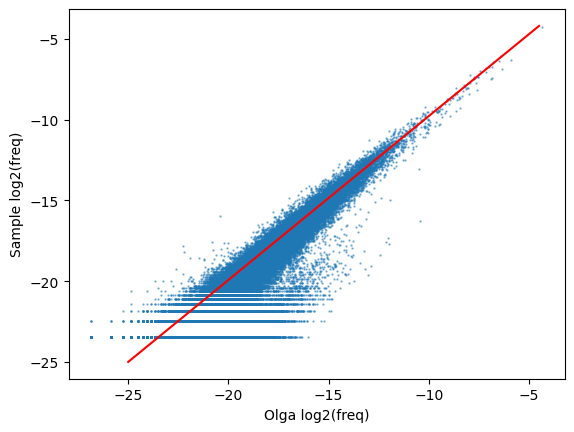

In [70]:
plt.scatter(olga_kmers,
            keck_kmers,
            s = 0.5,
            alpha = 0.5)
plt.plot([-25, -4.5], [-25, -4.2], c = 'r')
plt.xlabel('Olga log2(freq)')
plt.ylabel('Sample log2(freq)')
#plt.plot(np.log2(np.arange(0, 1, 0.01)), np.log2(np.arange(0, 1, 0.01)))

In [74]:
#прочитаем все заново, да, не очень хорошо, но можно запускать код отсюда
keck_kmers = pd.read_csv('/home/dluppov/Sample_kmers_counts_mirror_sum.csv', index_col=0)
olga_kmers = pd.read_csv('/home/dluppov/OLGA_kmers_counts_mirror_sum.csv', index_col=0)

# keck_kmers = pd.read_csv('./Sample_k2mers_counts.csv', index_col=0)
# olga_kmers = pd.read_csv('./Olga_k2mers_counts.csv', index_col=0)

hashes_keck = pd.Series(keck_kmers.index).apply(lambda x: palindrome_hash(x))
hashes_keck.index = keck_kmers.index
keck_kmers.index.name = 'kmer'
keck_kmers.insert(0, 'hash', hashes_keck)

keck_kmers = keck_kmers.reset_index().set_index('hash')

hashes_olga = pd.Series(olga_kmers.index).apply(lambda x: palindrome_hash(x))
hashes_olga.index = olga_kmers.index
olga_kmers.index.name = 'kmer'
olga_kmers.insert(0, 'hash', hashes_olga)
olga_kmers = olga_kmers.reset_index().set_index('hash')

common_kmers = list(set(keck_kmers.index).intersection(olga_kmers.index))

olga_kmers = olga_kmers.loc[common_kmers]
keck_kmers = keck_kmers.loc[common_kmers]


keck_kmers = keck_kmers['0']
olga_kmers = olga_kmers['0']

keck_kmers.name = 'keck_freq'
olga_kmers.name = 'olga_freq'

olga_kmers.index = pd.Series(olga_kmers.index).apply(lambda x: hases_dict[x])
keck_kmers.index = pd.Series(keck_kmers.index).apply(lambda x: hases_dict[x])

n = keck_kmers.sum()
m = olga_kmers.sum()
ps = olga_kmers/olga_kmers.sum()
mus = ps*n


In [75]:
#выполним хи-квадрат тест
res_dict = {}
for ind in keck_kmers.index:
    res_dict[ind] = scp.chi2_contingency([[keck_kmers[ind], n - keck_kmers[ind]],
                                         [olga_kmers[ind], m - olga_kmers[ind]]])[1]

In [76]:
p_vals = pd.Series(res_dict)
p_vals

IQTW    0.683550
AGKV    0.030407
MQPG    0.299740
VRHA    0.000081
QIWV    0.981295
          ...   
TLEH    0.530665
AIWR    0.003299
AQDP    0.539001
NDDQ    0.051345
ARSA    0.024181
Length: 65170, dtype: float64

In [77]:
p_vals = p_vals.apply(lambda x: 10**(-100) if x < 10**(-100) else x)

In [78]:
log_pvals = np.log10(p_vals)
log_pvals

IQTW   -0.165229
AGKV   -1.517022
MQPG   -0.523255
VRHA   -4.089467
QIWV   -0.008200
          ...   
TLEH   -0.275180
AIWR   -2.481677
AQDP   -0.268410
NDDQ   -1.289498
ARSA   -1.616530
Length: 65170, dtype: float64

In [79]:
keck_kmers = keck_kmers/keck_kmers.sum()
olga_kmers = olga_kmers/olga_kmers.sum()

fold_change_freq = np.log2(keck_kmers/olga_kmers)
fold_change_freq.name = 'log2FC'

keck_kmers = np.log2(keck_kmers[fold_change_freq.index])
olga_kmers = np.log2(olga_kmers[fold_change_freq.index])


summing_df = pd.concat([fold_change_freq, olga_kmers, keck_kmers], axis = 1)
summing_df

,log2FC,olga_freq,keck_freq
hash,,,
IQTW,-0.726724,-21.716257,-22.442981
AGKV,-0.289318,-16.131295,-16.420613
MQPG,-0.619808,-19.823172,-20.442981
VRHA,-1.023705,-17.419275,-18.442981
QIWV,0.193106,-21.636087,-21.442981
...,...,...,...
TLEH,-0.448297,-20.187329,-20.635626
AIWR,-1.362975,-18.758077,-20.121053
AQDP,-0.204497,-18.483596,-18.688093


In [80]:
summing_df_all = pd.concat([summing_df, log_pvals], axis = 1)
summing_df_all.rename(columns = {0: 'log10_p_val'}, inplace = True)
summing_df_all

,log2FC,olga_freq,keck_freq,log10_p_val
IQTW,-0.726724,-21.716257,-22.442981,-0.165229
AGKV,-0.289318,-16.131295,-16.420613,-1.517022
MQPG,-0.619808,-19.823172,-20.442981,-0.523255
VRHA,-1.023705,-17.419275,-18.442981,-4.089467
QIWV,0.193106,-21.636087,-21.442981,-0.008200
...,...,...,...,...
TLEH,-0.448297,-20.187329,-20.635626,-0.275180
AIWR,-1.362975,-18.758077,-20.121053,-2.481677
AQDP,-0.204497,-18.483596,-18.688093,-0.268410
NDDQ,-0.906193,-19.077356,-19.983549,-1.289498


In [81]:
import plotly.express as px
df = px.data.tips()

fig = px.scatter(summing_df_all, x="olga_freq", y="keck_freq", color="log10_p_val")
fig.update_traces(marker=dict(size=4, opacity = 0.4))

fig.add_scatter(x = [-17, -4.5], y = [-17, -4.2], mode = 'lines')

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    margin=dict(
        l=100,
        r=100,
       b=60,
        t=60,
        pad=0
    ),
)

fig.show()

In [94]:
summing_df_all[summing_df_all.olga_freq < -20][summing_df_all.keck_freq > -16]

/home/dluppov/.conda-envs/python3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



,log2FC,olga_freq,keck_freq,log10_p_val
CISV,4.46011,-20.419275,-15.959165,-100.0


Text(0.5, 1.0, 'OLGA vs Sample')

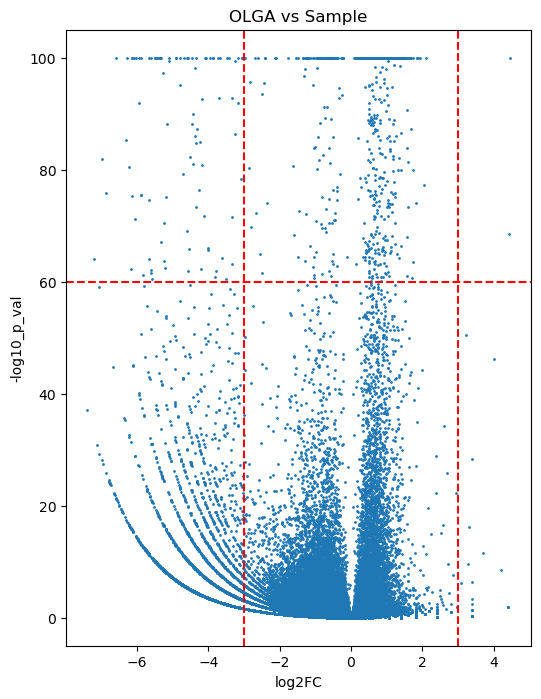

In [83]:
plt.figure(figsize=(6, 8))
plt.scatter(summing_df_all.log2FC, -summing_df_all.log10_p_val, s = 1)
plt.xlabel('log2FC')
plt.ylabel('-log10_p_val')
plt.axvline(-3, color= 'r', linestyle = '--')
plt.axvline(3, color = 'r', linestyle = '--')
plt.axhline(60, color = 'r', linestyle = '--')
plt.title('OLGA vs Sample')

In [86]:
#напечатаем левый верхний угол
for gene in summing_df_all[summing_df_all.log2FC < -3][summing_df_all.log10_p_val < -60].index:
    print(gene)

CAKP
CPSS
SSGC
CLSS
CNEK
CYEQ
GCGG
RGCS
CYGY
GGCS
QECG
GYCG
CQET
GPAC
TCGG
GGRC
CNQP
ARAC
GQGC
LRAC
SSCL
GCYE
RCNQ
GCLS
TGGC
CARP
DRCS
CGYT
CSYN
CAPP
RCYE
CYSS
DCSS
SSCA
CESS
QCSS
RDRC
CEAF
TSDC
CTGE
QGPC
CSYE
CARF
CEKL
RGGC
TGCS
CEQF
CGEL
PCLS
CEQY
GGPC
CAWP
CQPQ
QTEC
SSCT
CRSS
GPCS
CTDT
DTCR
NETQ
CTEA
DRAC
GRGC
CGRD
GRCS
CSSA
GCTD
VCSS
RGRC
CYNE
CRSA
GCSS
PCSS
RCSS
CNYG
YCGG
GSCG
GRAC
SRGC
SSFC
LAGC
CAKG
CSGN
CGGA
GCSY
SCSS
CSNQ
SLCR
GGGC
CAKR
VRAC
CAPR
CDSS
GTGC
GSCS
ASGC
TSGC
SGGC
CNEQ
GCNQ


/home/dluppov/.conda-envs/python3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



https://weblogo.threeplusone.com/create.cgi

# Coupled genes

In [3]:
olga_trb = pd.read_csv('/home/dluppov/TRB_10_7.tsv', sep = '\t', header = None)
olga_trb.rename(columns = {0: 'seq', 1: 'aa', 2: 'V_gene', 3: 'J_gene'}, inplace = True)
olga_trb

,seq,aa,V_gene,J_gene
0,TGTGCCAGCAGCGGTAGGGGGACACTATTGGGCACCTTC,CASSGRGTLLGTF,TRBV7-9,TRBJ1-2
1,TGTGGACGGAAGGACGAGCAGTACTTC,CGRKDEQYF,TRBV20-1,TRBJ2-7
2,TGCAGTGCTCGGGGCGTCTTCTCTGAAGCTTTCTTT,CSARGVFSEAFF,TRBV20-1,TRBJ1-1
3,TGTGCCACCAATGACAGGGGGCGCACCTACAATGAGCAGTTCTTC,CATNDRGRTYNEQFF,TRBV24-1,TRBJ2-1
4,TGTGCCAGCAGTTTAGCTGGACTAGCGGGTTGTCGGAAGTTGACGG...,CASSLAGLAGCRKLTEETQYF,TRBV27,TRBJ2-5
...,...,...,...,...
9999995,TGTGCCAGCAGTTACTCGACCCGCCCGGTGCGGACCGGGGAGCTGT...,CASSYSTRPVRTGELFF,TRBV6-5,TRBJ2-2
9999996,TGTGCCCCGGAGGGGGAGAGGGGGGGGTCCTACGAGCAGTACTTC,CAPEGERGGSYEQYF,TRBV24-1,TRBJ2-7
9999997,TGTGCCAGCAGCCAAGACCCGGGACAGGGTTCGGCTTTCTTT,CASSQDPGQGSAFF,TRBV3-1,TRBJ1-1
9999998,TGCAGTGCTAGAGATCGCCGGGACAGGGGGAACACTGAAGCTTTCTTT,CSARDRRDRGNTEAFF,TRBV20-1,TRBJ1-1


In [4]:
olga_trb.V_gene = olga_trb.V_gene.apply(lambda x: x.split('-')[0])
olga_trb.J_gene = olga_trb.J_gene.apply(lambda x: x.split('-')[0])

In [8]:
olga_trb.insert(4, 'Joint', olga_trb.V_gene + olga_trb.J_gene)

In [13]:
keck_raw = pd.read_csv('/home/dluppov/tcr-thymic-selection/naive_cells/hip_full/naive_clonotypes_keck.csv.gz')
keck_raw = keck_raw.loc[np.logical_and(keck_raw.cdr3aa.str.startswith('C'),
               np.logical_or(keck_raw.cdr3aa.str.endswith('W'), keck_raw.cdr3aa.str.endswith('F')))]

In [14]:
keck_raw.v = keck_raw.v.apply(lambda x: x.split(',')[0].split('-')[0])
keck_raw.j = keck_raw.j.apply(lambda x: x.split(',')[0].split('-')[0])
keck_raw.insert(3, 'Joint', keck_raw.v + keck_raw.j)

In [22]:
keck_raw_freq = keck_raw.Joint.value_counts()
olga_trb_freq = olga_trb.Joint.value_counts()


In [27]:
keck_raw_freq = keck_raw_freq.loc[olga_trb_freq.index]

In [28]:
keck_raw_norm_freq = keck_raw_freq/keck_raw_freq.sum()
olga_trb__norm_freq = olga_trb_freq/olga_trb_freq.sum()

In [31]:
fc_freq = keck_raw_norm_freq/olga_trb__norm_freq

n = keck_raw_freq.sum()
m = olga_trb_freq.sum()
res_dict = {}
for ind in keck_raw_freq.index:
    res_dict[ind] = scp.chi2_contingency([[keck_raw_freq[ind], n - keck_raw_freq[ind]],
                                         [olga_trb_freq[ind], m - olga_trb_freq[ind]]])[1]

Text(0.5, 1.0, 'OLGA vs Sample')

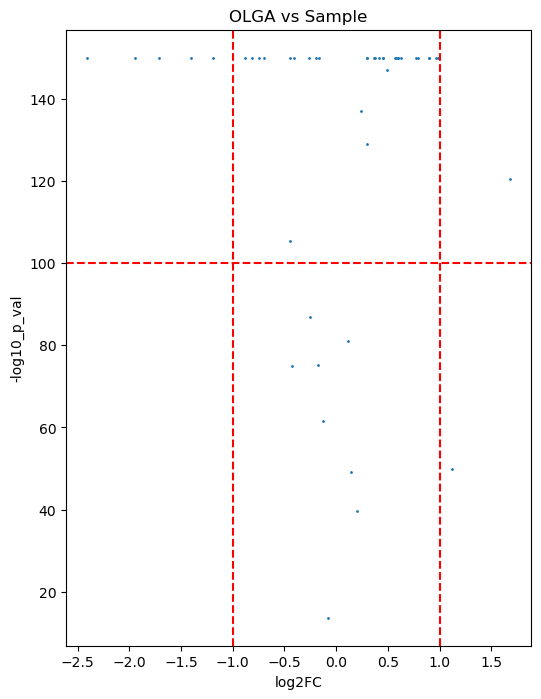

In [39]:
p_vals = pd.Series(res_dict)
p_vals = p_vals.apply(lambda x: 10**(-150) if x < 10**(-150) else x)
log_pvals = np.log10(p_vals)
plt.figure(figsize=(6, 8))
plt.scatter(np.log2(fc_freq), -log_pvals, s = 1)
plt.xlabel('log2FC')
plt.ylabel('-log10_p_val')
plt.axvline(-1, color= 'r', linestyle = '--')
plt.axvline(1, color = 'r', linestyle = '--')
plt.axhline(100, color = 'r', linestyle = '--')
plt.title('OLGA vs Sample')

In [41]:
np.log2(fc_freq)[np.log2(fc_freq) <= -1]

TRBV13TRBJ2   -1.946432
TRBV24TRBJ1   -1.714351
TRBV13TRBJ1   -2.406823
TRBV14TRBJ2   -1.193356
TRBV14TRBJ1   -1.404390
Name: Joint, dtype: float64

TRBV13TRBJ1 - странный

# Physical chemistry

In [53]:
import peptides

In [ ]:
olga_trb_charge.name = 'charge'

In [ ]:
pd.concat([olga_trb, olga_trb_charge], axis = 1).to_csv('/home/dluppov/olga_trb_charge.csv')

In [ ]:
keck_raw = pd.read_csv('/home/dluppov/tcr-thymic-selection/naive_cells/hip_full/naive_clonotypes_keck.csv.gz')
keck_raw = keck_raw.loc[np.logical_and(keck_raw.cdr3aa.str.startswith('C'),
               np.logical_or(keck_raw.cdr3aa.str.endswith('W'), keck_raw.cdr3aa.str.endswith('F')))]
               

In [31]:
keck_raw_charge = keck_raw.cdr3aa.apply(lambda x: peptides.Peptide(x).charge())
keck_raw_charge

3        -1.062215
4         0.935307
5         0.026919
6        -0.972635
7        -1.063916
            ...   
968558    0.935786
968559   -0.065540
968560   -1.066095
968561   -0.063919
968562   -0.064770
Name: cdr3aa, Length: 964889, dtype: float64

In [33]:
keck_raw_charge.name = 'charge'

In [35]:
pd.concat([keck_raw, keck_raw_charge], axis = 1).to_csv('/home/dluppov/keck_charge.csv')

In [74]:
#биноминальное распределение - оценить вероятности 
#попробовать построить дов. интервалы
#Пуассон
#потестить длины и их дисперсии (Kruskal-Wallis)
#физикохимические штуки - смотреть на значисые по FC


In [37]:
keck_charge = pd.read_csv('/home/dluppov/keck_charge.csv')
olga_charge = pd.read_csv('/home/dluppov/olga_trb_charge.csv')

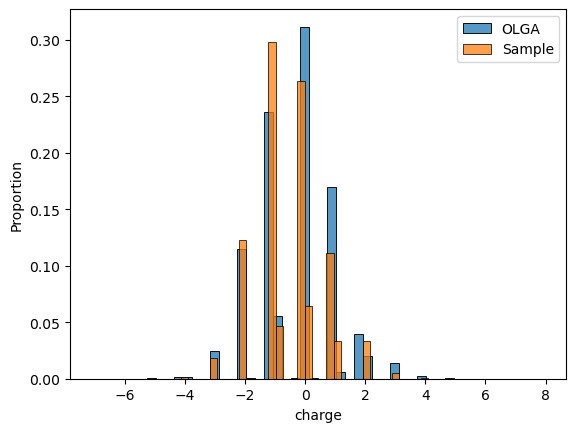

In [50]:
sns.histplot(olga_charge.charge, bins = 50, stat = 'proportion', label = 'OLGA')
sns.histplot(keck_charge.charge, bins = 50, stat = "proportion", label = 'Sample')
plt.legend()
plt.show()

In [51]:
charge_res =scp.mannwhitneyu(olga_charge.charge, keck_charge.charge)
charge_res

MannwhitneyuResult(statistic=4430574966084.5, pvalue=0.0)

In [60]:
keck_hydrophobicity = keck_charge.cdr3aa.apply(lambda x: peptides.Peptide(x).hydrophobicity())
keck_hydrophobicity

0         0.321429
1        -0.430769
2         0.916667
3        -0.130769
4         0.118182
            ...   
964884   -0.616667
964885   -0.966667
964886   -0.376923
964887   -1.183333
964888   -0.454545
Name: cdr3aa, Length: 964889, dtype: float64

In [61]:
pd.concat([keck_charge, keck_hydrophobicity], axis = 1).to_csv('/home/dluppov/keck_charge_hydrophobicity.csv')

In [37]:
olga_trb_hydrophobicity = pd.read_csv('/home/dluppov/olga_trb_charge_hydrophobicity.csv',index_col=0)
keck_hydrophobicity = pd.read_csv('/home/dluppov/keck_charge_hydrophobicity.csv', index_col=0)
#olga_trb_hydrophobicity.drop(['Unnamed: 0', 'Unnamed: 0.1'], axis = 1).to_csv('olga_trb_charge_hydrophobicity.csv')

In [38]:
olga_trb_hydrophobicity.rename(columns = {'aa.1': 'hydrophobicity'}, inplace=True)
keck_hydrophobicity.rename(columns = {'cdr3aa.1': 'hydrophobicity'}, inplace=True)

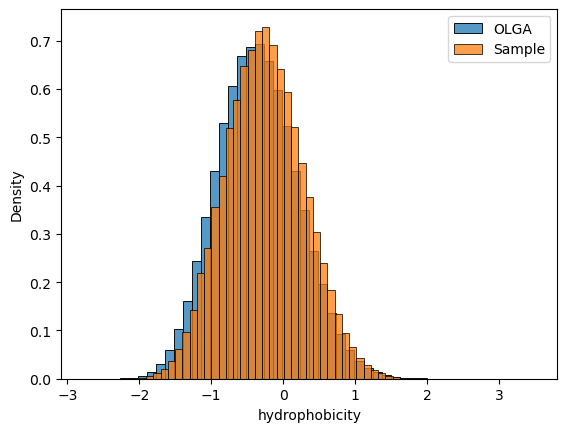

In [39]:
sns.histplot(olga_trb_hydrophobicity.hydrophobicity, bins = 50, stat = 'density', label = 'OLGA')
sns.histplot(keck_hydrophobicity.hydrophobicity, bins = 50, stat = "density", label = 'Sample')
plt.legend()
plt.show()

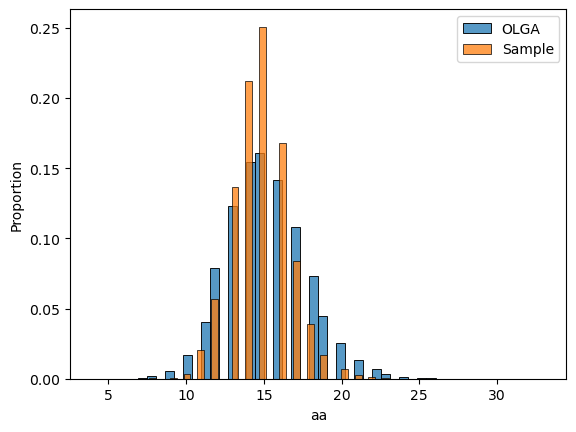

In [40]:
sns.histplot(olga_trb_hydrophobicity.aa.apply(len), bins = 50, stat = 'proportion', label = 'OLGA')
sns.histplot(keck_hydrophobicity.cdr3aa.apply(len), bins = 50, stat = 'proportion', label = 'Sample')
plt.legend()
plt.show()

In [41]:
olga_lens = olga_trb_hydrophobicity.aa.apply(len)
keck_kens = keck_hydrophobicity.cdr3aa.apply(len)



In [42]:
res_lens= scp.kruskal(olga_lens, keck_kens)
res_lens

KruskalResult(statistic=10762.210284472058, pvalue=0.0)

In [43]:
olga_lens.std()/keck_kens.std()

1.4376460476808546

In [44]:
def f_test(x, y):
    x = np.array(x)
    y = np.array(y)
    f = np.var(x, ddof=1)/np.var(y, ddof=1) #calculate F test statistic 
    dfn = x.size-1 #define degrees of freedom numerator 
    dfd = y.size-1 #define degrees of freedom denominator 
    p = 1-scp.f.cdf(f, dfn, dfd) #find p-value of F test statistic 
    return f, p

In [45]:
f_test(olga_lens, keck_kens)

(2.066826158397984, 1.1102230246251565e-16)

In [46]:
keck_hydrophobicity.v = keck_hydrophobicity.v.apply(lambda x: x.split(',')[0].split('-')[0])
keck_hydrophobicity.v.value_counts()

TRBV6     118116
TRBV7     102485
TRBV5     101034
TRBV20     93946
TRBV4      52028
TRBV19     48921
TRBV28     48134
TRBV12     46489
TRBV9      38427
TRBV27     38422
TRBV2      36173
TRBV30     33064
TRBV11     32260
TRBV3      31136
TRBV10     28299
TRBV29     25283
TRBV18     23168
TRBV24     18398
TRBV15     14827
TRBV25      9247
TRBV14      8722
TRBV13      7406
TRBV21      5313
TRBV23      1990
TRBV16       900
TRBV1        682
TRBV8         10
TRBV22         9
Name: v, dtype: int64

In [47]:
keck_hydrophobicity

,cdr3aa,v,j,charge,hydrophobicity
0,CAAAAAGANNEQFF,TRBV2,TRBJ2-1,-1.062215,0.321429
1,CAAAAKRTDTQYF,TRBV7,TRBJ2-3,0.935307,-0.430769
2,CAAAALNSPLHF,TRBV6,TRBJ1-6,0.026919,0.916667
3,CAAAAMSDQPQHF,TRBV18,TRBJ1-5,-0.972635,-0.130769
4,CAAAAPYEQYF,TRBV28,TRBJ2-7,-1.063916,0.118182
...,...,...,...,...,...
964884,CYKLSGGREGYF,TRBV20,TRBJ2-7,0.935786,-0.616667
964885,CYPGQFKDTQYF,TRBV20,TRBJ2-3,-0.065540,-0.966667
964886,CYPSDATGYGYTF,TRBV20,TRBJ1-2,-1.066095,-0.376923
964887,CYRGGGQETQYF,TRBV20,TRBJ2-5,-0.063919,-1.183333


In [48]:
olga_trb_hydrophobicity.V_gene = olga_trb_hydrophobicity.V_gene.apply(lambda x: x.split('-')[0])
olga_trb_hydrophobicity.V_gene.value_counts()

TRBV6     1451585
TRBV7     1297763
TRBV5     1044209
TRBV20     710824
TRBV10     516925
TRBV27     485213
TRBV24     422639
TRBV12     419593
TRBV11     418541
TRBV9      389045
TRBV4      379600
TRBV19     344630
TRBV13     338216
TRBV28     290805
TRBV3      230358
TRBV14     221414
TRBV29     221113
TRBV30     218457
TRBV2      199045
TRBV18     153267
TRBV25     131160
TRBV15     112007
TRBV16       3591
Name: V_gene, dtype: int64

In [100]:
gene= 'TRBV13'
olga_gene = olga_trb_hydrophobicity[olga_trb_hydrophobicity.V_gene == gene]
keck_gene = keck_hydrophobicity[keck_hydrophobicity.v == gene]

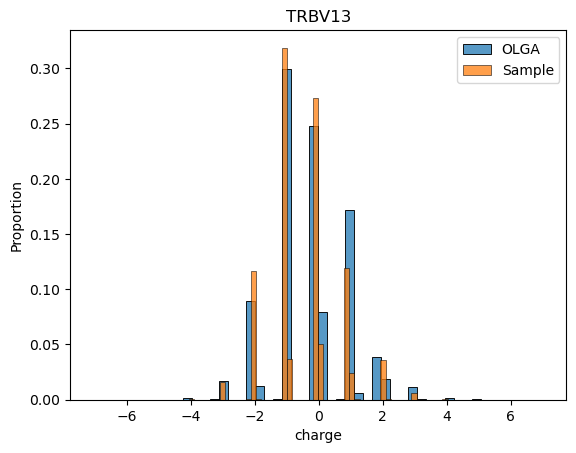

In [101]:
sns.histplot(olga_gene.charge, bins = 50, stat = 'proportion', label = 'OLGA')
sns.histplot(keck_gene.charge, bins = 50, stat = "proportion", label = 'Sample')
plt.title(gene)
plt.legend()
plt.show()

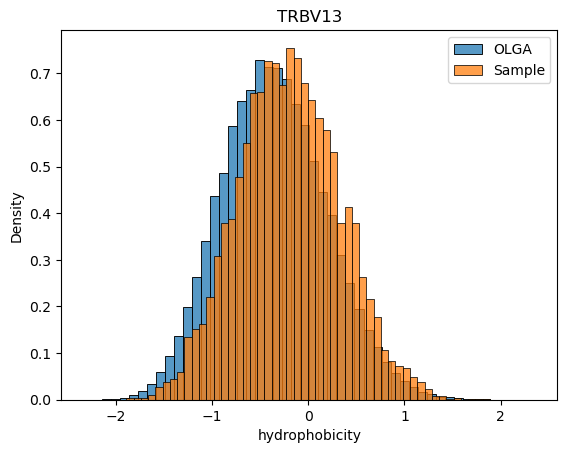

In [66]:
sns.histplot(olga_gene.hydrophobicity, bins = 50, stat = 'density', label = 'OLGA')
sns.histplot(keck_gene.hydrophobicity, bins = 50, stat = "density", label = 'Sample')
plt.title(gene)
plt.legend()
plt.show()

In [61]:
#weblogо  посмотреть
#тримеры
#kedera
#посмотреть на пары, а не на гены
#статтесты 
#посмотреть позиции тримеров
#погуглить про зараяд

# Genes pairs analysis

In [43]:
olga_trb_hydrophobicity = pd.read_csv('/home/dluppov/olga_trb_charge_hydrophobicity.csv',index_col=0)
keck_hydrophobicity = pd.read_csv('/home/dluppov/keck_charge_hydrophobicity.csv', index_col=0)

In [46]:
olga_trb_hydrophobicity.rename(columns = {'aa.1': 'hydrophobicity'}, inplace=True)
keck_hydrophobicity.rename(columns = {'cdr3aa.1': 'hydrophobicity'}, inplace=True)

In [48]:
olga_trb_hydrophobicity.V_gene = olga_trb_hydrophobicity.V_gene.apply(lambda x: x.split('-')[0])
olga_trb_hydrophobicity.J_gene = olga_trb_hydrophobicity.J_gene.apply(lambda x: x.split('-')[0])
olga_trb_hydrophobicity.insert(4, 'Joint', olga_trb_hydrophobicity.V_gene + olga_trb_hydrophobicity.J_gene)

In [49]:
keck_hydrophobicity = keck_hydrophobicity.loc[np.logical_and(keck_hydrophobicity.cdr3aa.str.startswith('C'),
               np.logical_or(keck_hydrophobicity.cdr3aa.str.endswith('W'),
                             keck_hydrophobicity.cdr3aa.str.endswith('F')))]

keck_hydrophobicity.v = keck_hydrophobicity.v.apply(lambda x: x.split(',')[0].split('-')[0])
keck_hydrophobicity.j = keck_hydrophobicity.j.apply(lambda x: x.split(',')[0].split('-')[0])
keck_hydrophobicity.insert(3, 'Joint', keck_hydrophobicity.v + keck_hydrophobicity.j)

In [59]:
olga_trb_hydrophobicity

,seq,aa,V_gene,J_gene,Joint,charge,hydrophobicity
0,TGTGCCAGCAGCGGTAGGGGGACACTATTGGGCACCTTC,CASSGRGTLLGTF,TRBV7,TRBJ1,TRBV7TRBJ1,0.936006,0.461538
1,TGTGGACGGAAGGACGAGCAGTACTTC,CGRKDEQYF,TRBV20,TRBJ2,TRBV20TRBJ2,-0.062918,-1.700000
2,TGCAGTGCTCGGGGCGTCTTCTCTGAAGCTTTCTTT,CSARGVFSEAFF,TRBV20,TRBJ1,TRBV20TRBJ1,-0.062219,0.725000
3,TGTGCCACCAATGACAGGGGGCGCACCTACAATGAGCAGTTCTTC,CATNDRGRTYNEQFF,TRBV24,TRBJ2,TRBV24TRBJ2,-0.062626,-1.313333
4,TGTGCCAGCAGTTTAGCTGGACTAGCGGGTTGTCGGAAGTTGACGG...,CASSLAGLAGCRKLTEETQYF,TRBV27,TRBJ2,TRBV27TRBJ2,-0.123564,0.028571
...,...,...,...,...,...,...,...
9999995,TGTGCCAGCAGTTACTCGACCCGCCCGGTGCGGACCGGGGAGCTGT...,CASSYSTRPVRTGELFF,TRBV6,TRBJ2,TRBV6TRBJ2,0.936928,-0.100000
9999996,TGTGCCCCGGAGGGGGAGAGGGGGGGGTCCTACGAGCAGTACTTC,CAPEGERGGSYEQYF,TRBV24,TRBJ2,TRBV24TRBJ2,-2.060369,-1.173333
9999997,TGTGCCAGCAGCCAAGACCCGGGACAGGGTTCGGCTTTCTTT,CASSQDPGQGSAFF,TRBV3,TRBJ1,TRBV3TRBJ1,-1.063544,-0.257143
9999998,TGCAGTGCTAGAGATCGCCGGGACAGGGGGAACACTGAAGCTTTCTTT,CSARDRRDRGNTEAFF,TRBV20,TRBJ1,TRBV20TRBJ1,0.938664,-1.387500


In [114]:
gene= 'TRBV14TRBJ1'
olga_gene = olga_trb_hydrophobicity[olga_trb_hydrophobicity.Joint == gene]
keck_gene = keck_hydrophobicity[keck_hydrophobicity.Joint == gene]

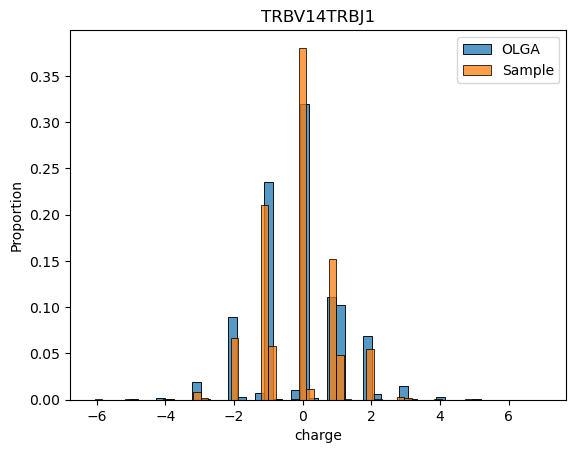

In [115]:
sns.histplot(olga_gene.charge, bins = 50, stat = 'proportion', label = 'OLGA')
sns.histplot(keck_gene.charge, bins = 50, stat = "proportion", label = 'Sample')
plt.title(gene)
plt.legend()
plt.show()

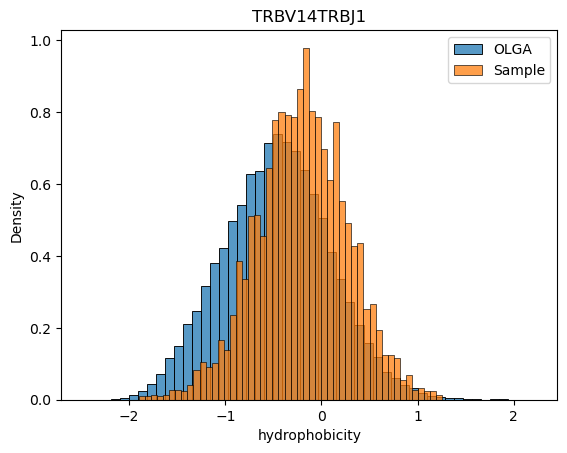

In [116]:
sns.histplot(olga_gene.hydrophobicity, bins = 50, stat = 'density', label = 'OLGA')
sns.histplot(keck_gene.hydrophobicity, bins = 50, stat = "density", label = 'Sample')
plt.title(gene)
plt.legend()
plt.show()

In [117]:
olga_gene_kidera = olga_gene.aa.apply(lambda x: peptides.Peptide(x).kidera_factors())
olga_gene_kidera

281        (0.05235294117647067, -0.6558823529411765, -0....
340        (-0.026000000000000016, -0.438, -0.18333333333...
365        (0.2846153846153846, -0.49076923076923085, -0....
464        (0.4166666666666667, -0.4713333333333331, 0.10...
554        (0.16100000000000003, -0.12600000000000003, 0....
                                 ...                        
9999382    (0.152, -0.4673333333333333, -0.28933333333333...
9999436    (0.040000000000000036, -0.3325000000000001, -0...
9999710    (-0.1638095238095238, -0.3138095238095237, 0.0...
9999777    (0.1694736842105263, 0.0015789473684210424, -0...
9999924    (0.018666666666666713, -0.4599999999999999, -0...
Name: aa, Length: 95300, dtype: object

In [118]:
keck_gene_kidera = keck_gene.cdr3aa.apply(lambda x: peptides.Peptide(x).kidera_factors())
keck_gene_kidera

3811      (0.14230769230769225, -0.6107692307692307, -0....
4481      (0.19466666666666663, -0.6873333333333332, -0....
6839      (0.07499999999999997, -0.31916666666666665, 0....
6860      (-0.22285714285714286, -0.08285714285714287, 0...
7409      (-0.23500000000000001, -0.24416666666666664, -...
                                ...                        
795891    (-0.05692307692307696, -0.4915384615384614, -0...
812552    (-0.30299999999999994, -0.45199999999999996, -...
813101    (0.23230769230769227, -0.4230769230769231, -0....
813143    (-0.04666666666666667, -0.5541666666666666, 0....
813431    (-0.21153846153846154, -0.4261538461538461, -0...
Name: cdr3aa, Length: 3445, dtype: object

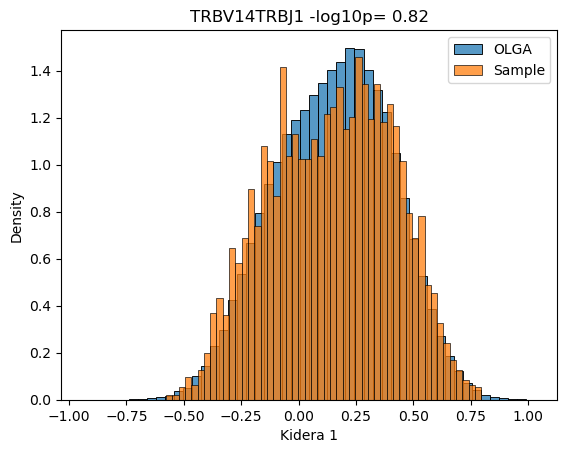

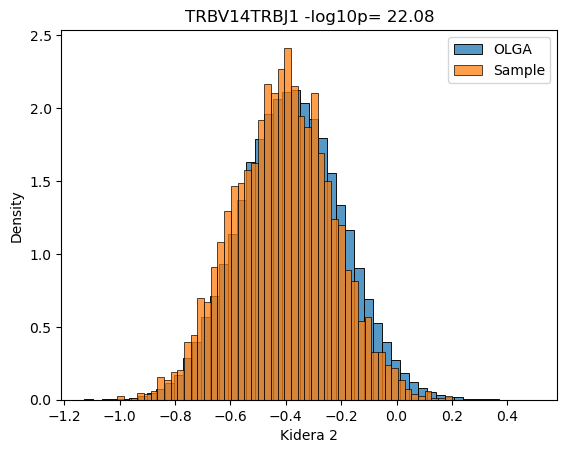

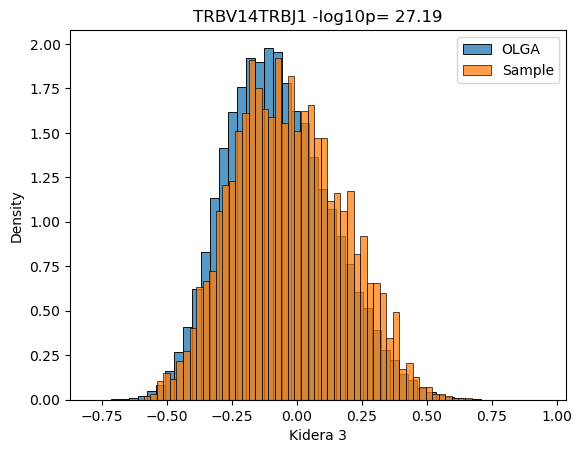

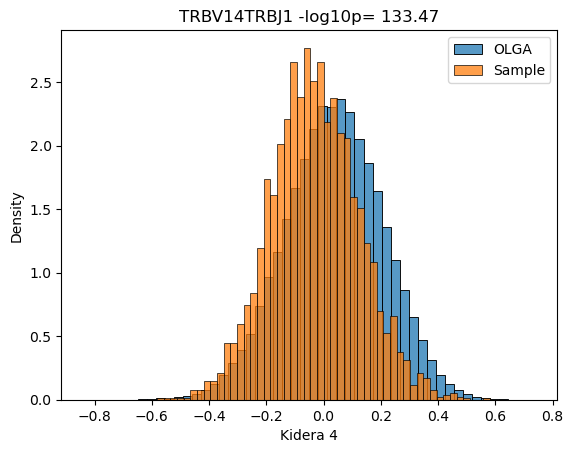

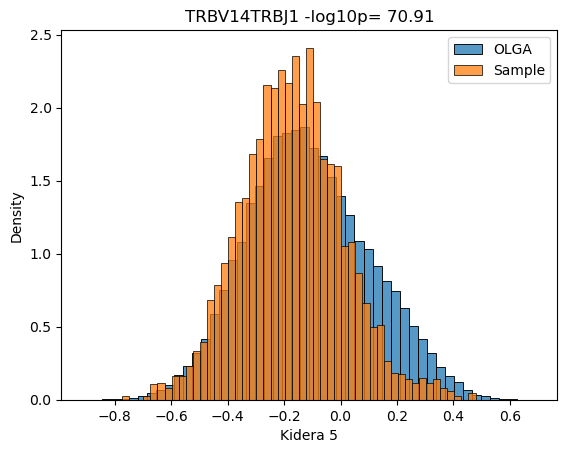

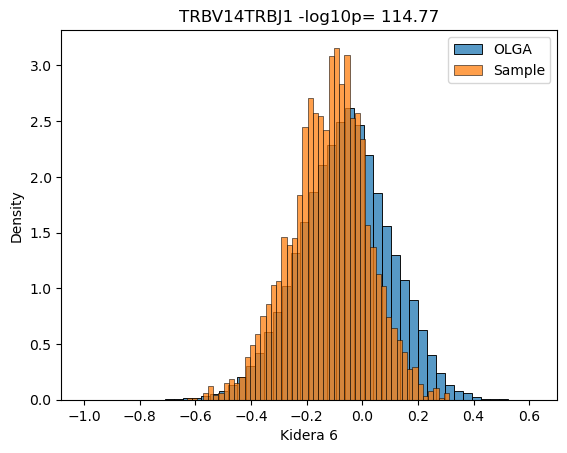

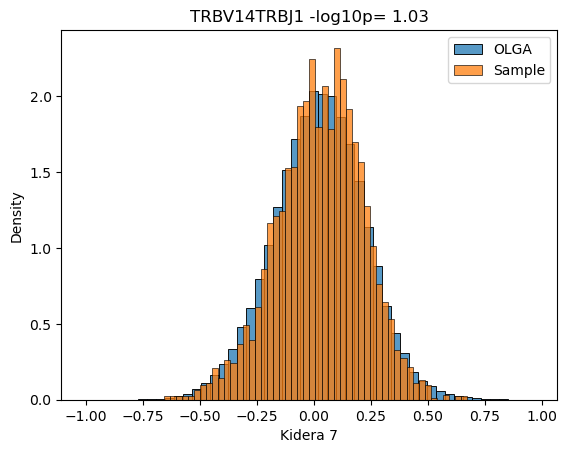

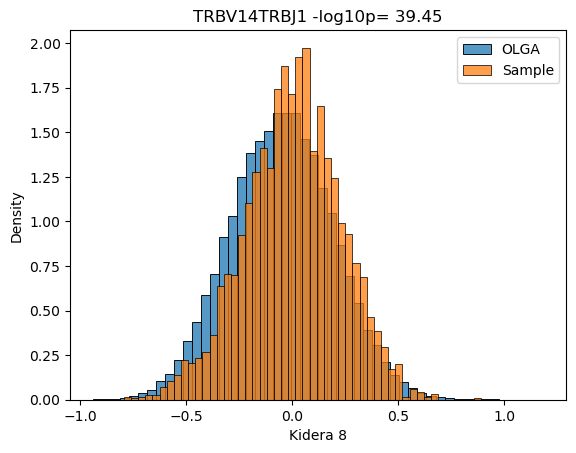

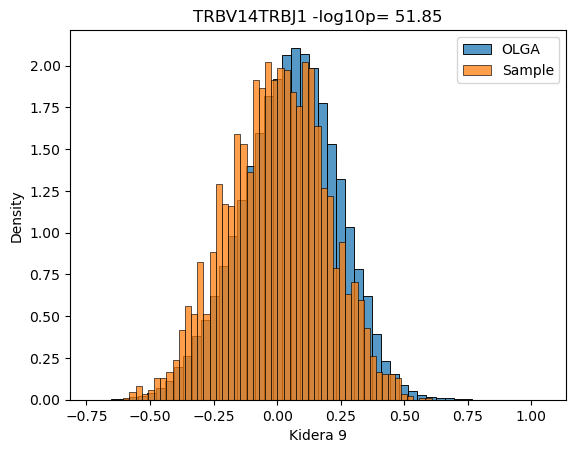

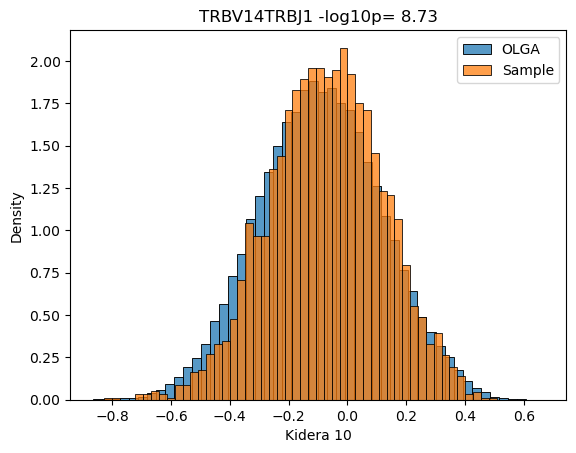

In [119]:
for i in range(10):
    
    sns.histplot(olga_gene_kidera.apply(lambda x: x[i]), bins = 50, stat = 'density', label = 'OLGA')
    sns.histplot(keck_gene_kidera.apply(lambda x: x[i]), bins = 50, stat = "density", label = 'Sample')
    plt.title(gene + f' -log10p= {-np.log10(scp.stats.ttest_ind(olga_gene_kidera.apply(lambda x: x[i]), keck_gene_kidera.apply(lambda x: x[i]), equal_var = False).pvalue):.2f}')
    plt.xlabel(f'Kidera {i+1}')
    plt.legend()
    plt.show()